In [1]:
import scanpy as sc
import os,sys,glob
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt

import seaborn as sns
from matplotlib.colors import ListedColormap

In [2]:
sc.settings.n_jobs = 36
sc.set_figure_params(figsize=(4, 4), vector_friendly = True)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

### Make a final metadata of NeuralCrest with scaled layer

In [5]:
adata = sc.read("Data/Output_230807_subset.NeuralCrest_finalmeta_SYK.h5ad") # 15s, 30G
adata

AnnData object with n_obs × n_vars = 276111 × 49133
    obs: 'batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI', 'Hemisphere', 'Library', 'Brain_Region', 'Dataset', 'Sex', 'Diagnosis', 'DF_classification', 'cluster_original', 'cluster_main', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cluster_number', 'cluster_raw', 'layer', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6'
    uns: 'cluster_main_colors', 'log1p'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    layers: 'counts', 'logcounts'

In [6]:
adata_scaled = sc.read("Data/Output_230807_subset.NeuralCrest_scaled_SYK.h5ad") # 53s, 100G
adata_scaled

AnnData object with n_obs × n_vars = 276111 × 49133
    obs: 'batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI', 'Hemisphere', 'Library', 'Brain_Region', 'Dataset', 'Sex', 'Diagnosis', 'DF_classification', 'cluster_original', 'cluster_main', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling'
    var: 'mean', 'std'
    uns: 'log1p'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    layers: 'scaled'

In [7]:
adata.layers["scaled"] = adata_scaled.layers["scaled"].copy()

In [8]:
adata.write_h5ad("Data/Output_230809_subset.NeuralCrest_final_scaled.h5ad")

### Cell clustering

In [9]:
adata_subset = sc.read_h5ad("Data/Output_230809_subset.NeuralCrest_final_scaled.h5ad")
adata_subset 

AnnData object with n_obs × n_vars = 276111 × 49133
    obs: 'batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI', 'Hemisphere', 'Library', 'Brain_Region', 'Dataset', 'Sex', 'Diagnosis', 'DF_classification', 'cluster_original', 'cluster_main', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cluster_number', 'cluster_raw', 'layer', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6'
    uns: 'cluster_main_colors', 'log1p'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    layers: 'counts', 'logcounts', 'scaled'

In [10]:
sc.pp.neighbors(adata_subset, use_rep="X_scVI")
sc.tl.umap(adata_subset)

In [11]:
adata_subset

AnnData object with n_obs × n_vars = 276111 × 49133
    obs: 'batch', 'sampleID', 'Age', 'Assay', 'Stage', 'Race', 'PMI', 'Hemisphere', 'Library', 'Brain_Region', 'Dataset', 'Sex', 'Diagnosis', 'DF_classification', 'cluster_original', 'cluster_main', 'n_genes', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cluster_number', 'cluster_raw', 'layer', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6'
    uns: 'cluster_main_colors', 'log1p', 'neighbors', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    layers: 'counts', 'logcounts', 'scaled'
    obsp: 'distances', 'connectivities'

In [12]:
adata_subset.obs['Stage2'] = 'Unknown'
# Set the value of 'Stage2' to 'First trimester' if 'Age' is between 7 and 30
adata_subset.obs.loc[(adata_subset.obs['Age'] <= 7 * 14), 'Stage2'] = 'Fetal (1st trimester)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 7 * 14) & (adata_subset.obs['Age'] <= 7 * 24), 'Stage2'] = 'Fetal (2nd trimester)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 7 * 24) & (adata_subset.obs['Age'] <= 365), 'Stage2'] = 'Fetal (3rd trimester)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 365) & (adata_subset.obs['Age'] <= 545), 'Stage2'] = 'Neonatal'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 545) & (adata_subset.obs['Age'] <= 2555), 'Stage2'] = 'Childhood (1-6Y)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 2555) & (adata_subset.obs['Age'] <= 4745), 'Stage2'] = 'Childhood (6-12Y)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 4745) & (adata_subset.obs['Age'] <= 7665), 'Stage2'] = 'Adolescence (12-20Y)'
adata_subset.obs.loc[(adata_subset.obs['Age'] >= 7665) & (adata_subset.obs['Age'] <= 14965), 'Stage2'] = 'Adult (20-40Y)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 14965) & (adata_subset.obs['Age'] <= 22265), 'Stage2'] = 'Adult (40-60Y)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 22265) & (adata_subset.obs['Age'] <= 29565), 'Stage2'] = 'Adult (60-80Y)'
adata_subset.obs.loc[(adata_subset.obs['Age'] > 29565), 'Stage2'] = 'Adult (>80Y)'

In [13]:
adata_subset.obs['Stage2'].value_counts()

Fetal (1st trimester)    223752
Fetal (2nd trimester)     52058
Adult (20-40Y)              142
Adult (>80Y)                119
Adult (60-80Y)               36
Neonatal                      3
Adult (40-60Y)                1
Name: Stage2, dtype: int64

In [14]:
adata_subset.obs['Stage2'] = adata_subset.obs['Stage2'].astype('category')
adata_subset.obs['Stage2'].cat.reorder_categories(['Fetal (1st trimester)', 'Fetal (2nd trimester)', 'Neonatal', 'Adult (20-40Y)', 'Adult (40-60Y)', 'Adult (60-80Y)', 'Adult (>80Y)'], inplace=True)

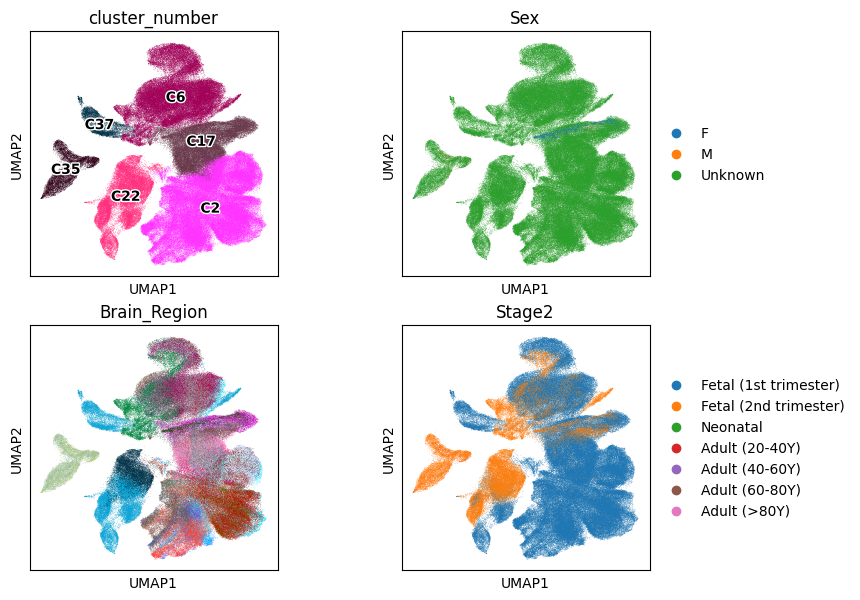

In [ ]:
import matplotlib.pyplot as plt
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(8,7), gridspec_kw={'wspace':0.5})

ax1_dict = sc.pl.umap(adata_subset, color = "cluster_number", ax = ax1, legend_loc='on data', legend_fontsize=10, legend_fontoutline=2, show = False)
ax2_dict = sc.pl.umap(adata_subset, color = "Sex", ax = ax2, show = False)
ax3_dict = sc.pl.umap(adata_subset, color = "Brain_Region", ax = ax3, show = False, legend_loc = None)
ax4_dict = sc.pl.umap(adata_subset, color = "Stage2", ax = ax4, show = False)

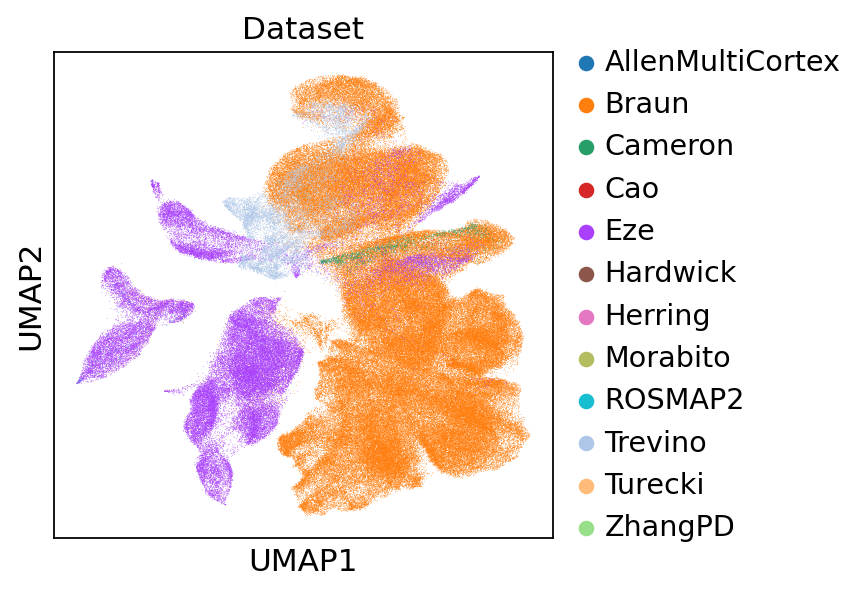

In [ ]:
sc.pl.umap(adata_subset, color = 'Dataset')

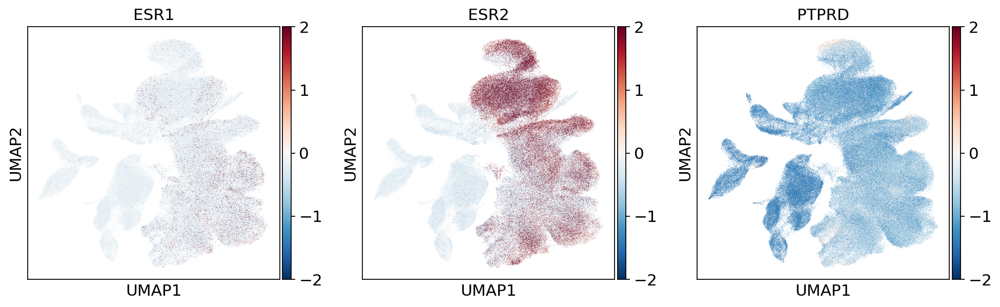

In [ ]:
marker_genes = ['ESR1', 'ESR2', 'PTPRD']
sc.set_figure_params(figsize=(4, 4), vector_friendly = True)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

sc.pl.umap(adata_subset, color = marker_genes, cmap='RdBu_r', layer = "scaled", vmin = -2, vmax = 2, 
          legend_loc='on data', legend_fontsize=5)

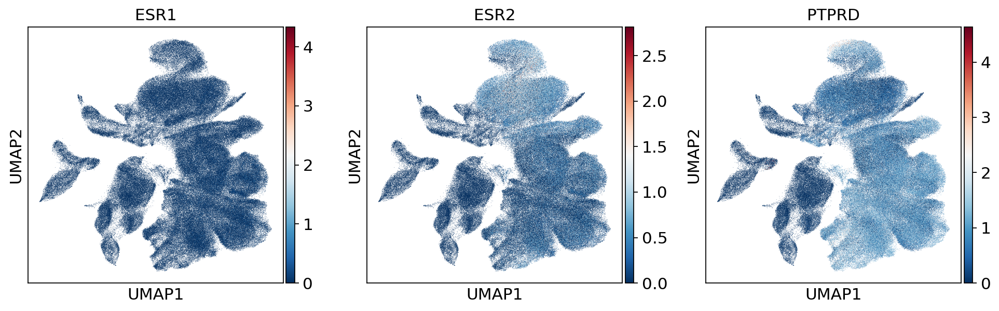

In [ ]:
sc.pl.umap(adata_subset, color = marker_genes, cmap='RdBu_r', layer = "logcounts",
          legend_loc='on data', legend_fontsize=5)

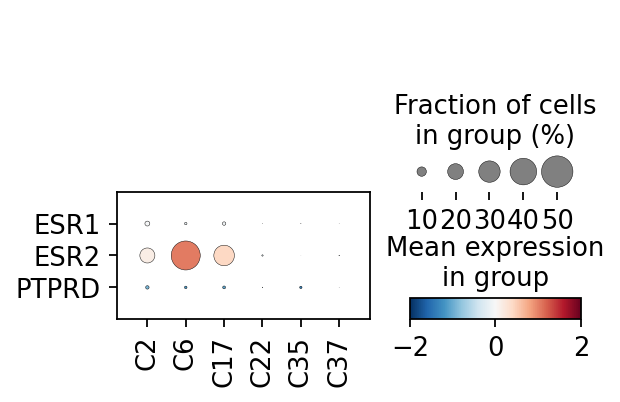

In [ ]:
sc.pl.dotplot(adata_subset, marker_genes, groupby='cluster_number', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', swap_axes= True)

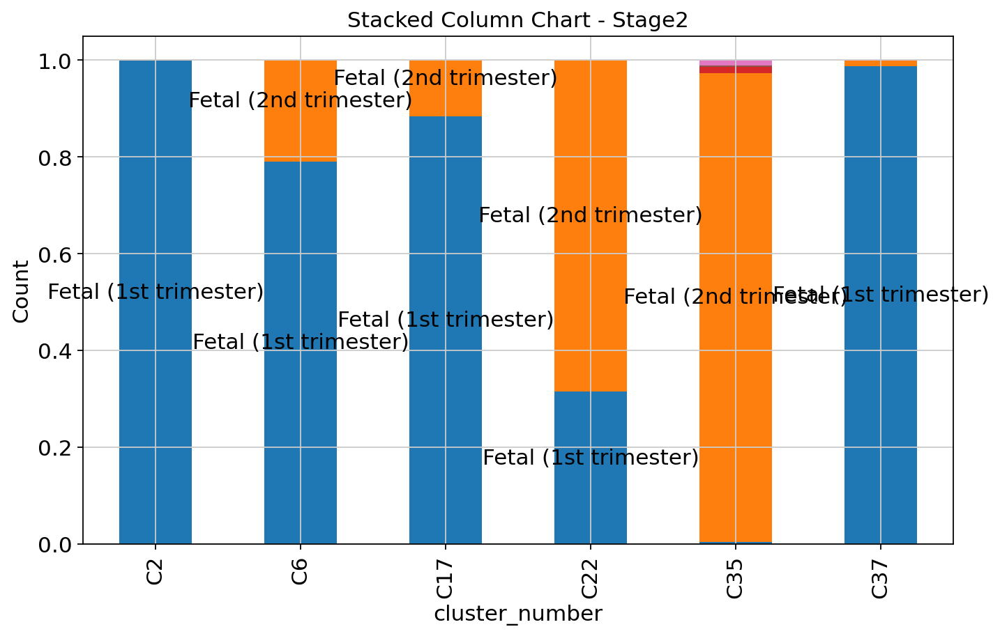

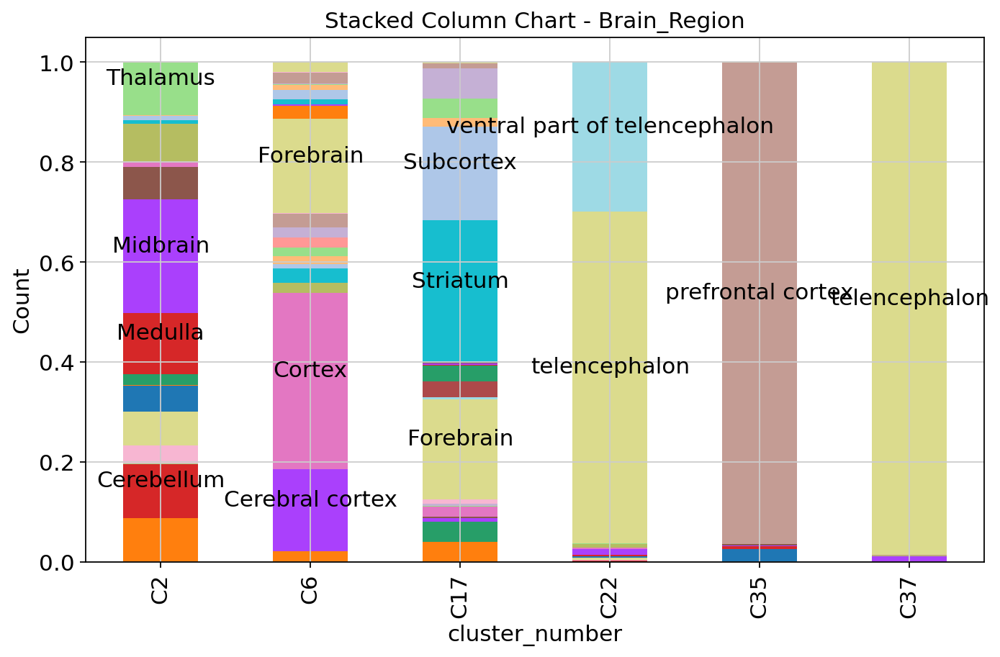

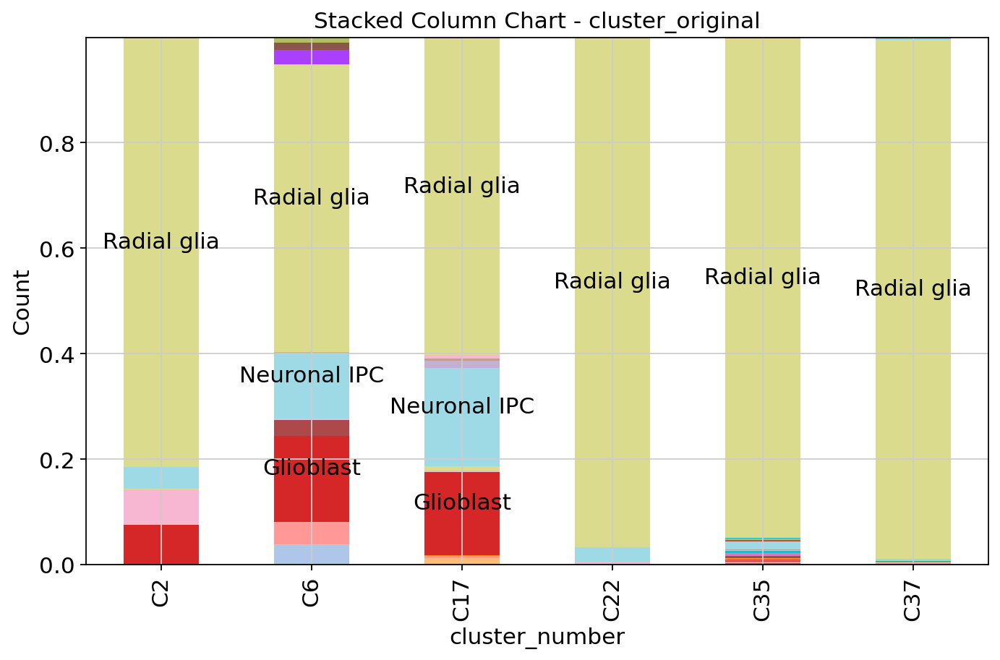

In [ ]:
import matplotlib.pyplot as plt
df1 = adata_subset.obs[['Stage2', 'Brain_Region', 'cluster_original', 'cluster_number']]

# Iterate over the columns and create individual stacked column charts
for column in df1.columns[:-1]:  # Exclude the 'cluster_number' column

    # Calculate the count of each unique value in the 'cluster_number' column
    grouped = df1.groupby(['cluster_number', column]).size().reset_index(name='count')

    # Pivot the DataFrame to have the 'cluster_number' column as the index and other columns as columns
    pivot_df = grouped.pivot(index='cluster_number', columns=column, values='count').fillna(0)

    # Calculate the percentage of each category within each 'cluster_number' group
    stacked_df = pivot_df.div(pivot_df.sum(axis=1), axis=0)

    # Plotting the stacked column chart
    ax = stacked_df.plot(kind='bar', stacked=True, figsize=(10, 6))

    # Set the title and axis labels
    plt.title(f"Stacked Column Chart - {column}")
    plt.xlabel('cluster_number')
    plt.ylabel('Count')

    # Move the legend outside the plot
    ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0., ncol=2)

    # Add text labels on the stacked bars reflecting the bar group names
    for container, category in zip(ax.containers, stacked_df.columns):
        for rect in container.patches:
            x = rect.get_x() + rect.get_width() / 2
            y = rect.get_y() + rect.get_height() / 2
            label = category if rect.get_height() >= 0.1 else ""  # Use the category name as the label if the proportion exceeds 0.1
            ax.text(x, y, label, ha='center', va='bottom')

    # Remove the legend
    ax.legend().remove()

    # Display the chart
    plt.show()


In [ ]:
adata_subset.write_h5ad("Data/Output_230810_subset.NeuralCrest_processed_SYK.h5ad")

# Add layer information

In [ ]:
adata_subset.obs['X'] = adata_subset.obs.index
adata_subset.obs

,batch,sampleID,Age,Assay,Stage,Race,PMI,Hemisphere,Library,Brain_Region,...,cluster_raw,layer,L1,L2,L3,L4,L5,L6,Stage2,X
X,,,,,,,,,,,,,,,,,,,,,
F1S4_171205_383_E01,Unknown,H200.1030,20075.0,SMART-Seq v4,Adult,Caucasian,Unknown,L,snRNA,V1C,...,NaN,NaN,0,0,0,0,0,0,Adult (40-60Y),F1S4_171205_383_E01
10X119_2:TCGTACCCAGACAAAT,BRC2106A,10X119_2,6.6,10x Chromium 3' v2,Fetal,Unknown,Unknown,A,scRNA,Midbrain,...,Radial glia,NaN,0,0,0,0,0,0,Fetal (1st trimester),10X119_2:TCGTACCCAGACAAAT
10X124_8:TTAGGACGTGCCTGTG,BRC2114,10X124_8,6.9,10x Chromium 3' v2,Fetal,Unknown,Unknown,A,scRNA,Medulla,...,Radial glia,NaN,0,0,0,0,0,0,Fetal (1st trimester),10X124_8:TTAGGACGTGCCTGTG
10X181_3:ACCGTTCAGGTTGAGC,XDD:348,10X181_3,5.0,10x Chromium 3' v3,Fetal,Unknown,Unknown,A,scRNA,Head,...,Radial glia,NaN,0,0,0,0,0,0,Fetal (1st trimester),10X181_3:ACCGTTCAGGTTGAGC
10X116_6:TTCTCAACACGTGAGA,XHU:307,10X116_6,9.2,10x Chromium 3' v2,Fetal,Unknown,Unknown,A,scRNA,Pons,...,Glioblast,NaN,0,0,0,0,0,0,Fetal (1st trimester),10X116_6:TTCTCAACACGTGAGA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hsDG151PD_GCCATGGTCGACACCG-1,Unknown,hsDG151PD,29930.0,10x Chromium 3' v3,Adult,Unknown,Unknown,A,snRNA,BA9,...,ODC1,NaN,0,0,0,0,0,0,Adult (>80Y),hsDG151PD_GCCATGGTCGACACCG-1
hsDG151PD_GTTGAACGTGTATCCA-1,Unknown,hsDG151PD,29930.0,10x Chromium 3' v3,Adult,Unknown,Unknown,A,snRNA,BA9,...,ODC5,NaN,0,0,0,0,0,0,Adult (>80Y),hsDG151PD_GTTGAACGTGTATCCA-1
hsDG208PD_ACTATGGAGGCCATAG-1,Unknown,hsDG208PD,28470.0,10x Chromium 3' v3,Adult,Unknown,Unknown,A,snRNA,BA9,...,ODC1,NaN,0,0,0,0,0,0,Adult (60-80Y),hsDG208PD_ACTATGGAGGCCATAG-1


In [ ]:
meta_ver2 = pd.read_csv('Table/Brain_Atlas_Metadata_finalver.csv')

/home/ssun1116/anaconda3/envs/BrainAtlas/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3221: DtypeWarning: Columns (9,14,15,23) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [ ]:
sub_meta_ver2 = meta_ver2[meta_ver2['X'].isin(adata_subset.obs.index)]
sub_meta_ver2

,Unnamed: 0,X,Dataset,batch,sampleID,Age,Assay,Stage,Race,PMI,...,leiden,X_scvi_raw_norm_scaling,cluster_original,layer,L1,L2,L3,L4,L5,L6
2,3,10X101_1:AAACCTGGTCTGCGGT,Braun,XHU:297,10X101_1,10.0,10x Chromium 3' v2,Fetal,Unknown,Unknown,...,Neural crest (C6),13.458950,Radial glia,NaN,0,0,0,0,0,0
3,4,10X101_1:AAACCTGGTCTTTCAT,Braun,XHU:297,10X101_1,10.0,10x Chromium 3' v2,Fetal,Unknown,Unknown,...,Neural crest (C6),5.917160,Radial glia,NaN,0,0,0,0,0,0
6,7,10X101_1:AAACCTGTCGGTGTCG,Braun,XHU:297,10X101_1,10.0,10x Chromium 3' v2,Fetal,Unknown,Unknown,...,Neural crest (C6),7.062147,Radial glia,NaN,0,0,0,0,0,0
8,9,10X101_1:AAAGATGAGACAGAGA,Braun,XHU:297,10X101_1,10.0,10x Chromium 3' v2,Fetal,Unknown,Unknown,...,Neural crest (C6),17.064846,Neuronal IPC,NaN,0,0,0,0,0,0
12,13,10X101_1:AAAGATGTCACCCTCA,Braun,XHU:297,10X101_1,10.0,10x Chromium 3' v2,Fetal,Unknown,Unknown,...,Neural crest (C6),14.641289,Radial glia,NaN,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1853788,1853789,Sample-33_ACCCTCAAGTCATGAA-10,Morabito,3.0,Sample-33,29565.0,10x Chromium 3' v3,Adult,Unknown,Unknown,...,Neural crest (C35),102.040800,PER.END1,NaN,0,0,0,0,0,0
1860762,1860763,Sample-43_AGCCACGTCAGACCTA-2,Morabito,1.0,Sample-43,33215.0,10x Chromium 3' v3,Adult,Unknown,Unknown,...,Neural crest (C35),68.027210,ODC12,NaN,0,0,0,0,0,0
1873964,1873965,Sample-47_CACTTCGTCCCTGGTT-18,Morabito,3.0,Sample-47,33215.0,10x Chromium 3' v3,Adult,Unknown,Unknown,...,Neural crest (C35),45.871560,MG3,NaN,0,0,0,0,0,0
1882469,1882470,Sample-58_CAATCGAAGGAGATAG-13,Morabito,3.0,Sample-58,33215.0,10x Chromium 3' v3,Adult,Unknown,Unknown,...,Neural crest (C35),65.789470,PER.END1,NaN,0,0,0,0,0,0


In [ ]:
df = pd.merge(adata_subset.obs, sub_meta_ver2, on = ['X'])

In [ ]:
df.set_index('X', inplace=True)

In [ ]:
adata_subset.obs = df

In [ ]:
adata_subset.obs['L1'] = adata_subset.obs['L1'].astype('str')
adata_subset.obs['L2'] = adata_subset.obs['L2'].astype('str')
adata_subset.obs['L3'] = adata_subset.obs['L3'].astype('str')
adata_subset.obs['L4'] = adata_subset.obs['L4'].astype('str')
adata_subset.obs['L5'] = adata_subset.obs['L5'].astype('str')
adata_subset.obs['L6'] = adata_subset.obs['L6'].astype('str')

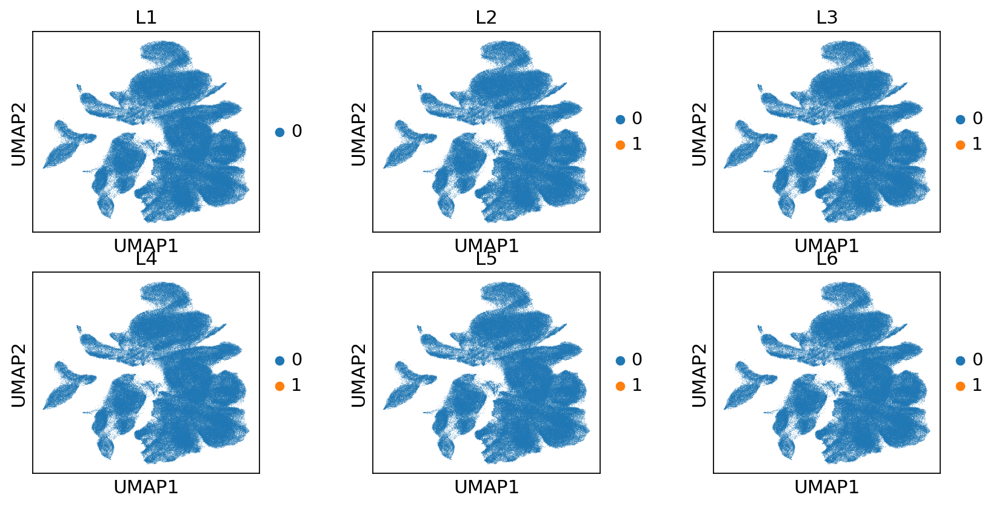

In [ ]:
import matplotlib.pyplot as plt
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(12,6), gridspec_kw={'wspace':0.5})

ax1_dict = sc.pl.umap(adata_subset, color = "L1", ax = ax1, show = False)
ax2_dict = sc.pl.umap(adata_subset, color = "L2", ax = ax2, show = False)
ax3_dict = sc.pl.umap(adata_subset, color = "L3", ax = ax3, show = False)
ax4_dict = sc.pl.umap(adata_subset, color = "L4", ax = ax4, show = False)
ax5_dict = sc.pl.umap(adata_subset, color = "L5", ax = ax5, show = False)
ax6_dict = sc.pl.umap(adata_subset, color = "L6", ax = ax6, show = False)

In [ ]:
cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_subset.var_names]
print(len(cell_cycle_genes))

97
94


In [ ]:
sc.tl.score_genes_cell_cycle(adata_subset, s_genes, g2m_genes, copy=False)

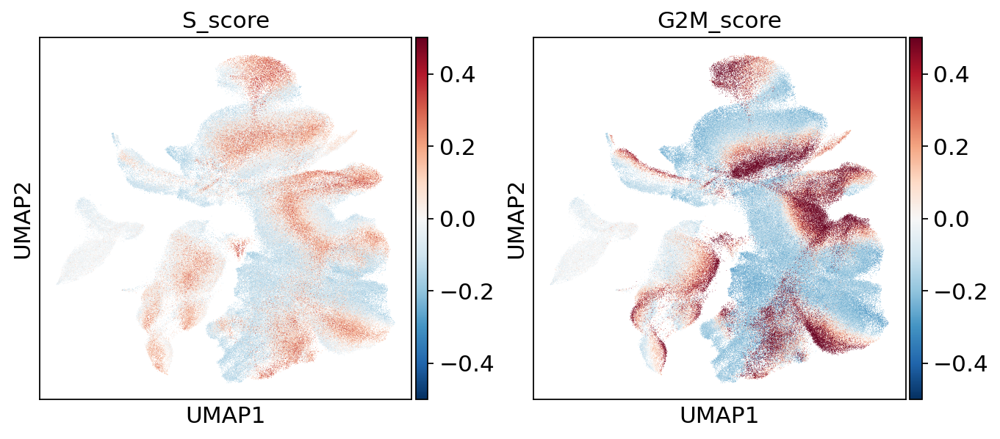

In [ ]:
sc.pl.umap(adata_subset, color = ['S_score', 'G2M_score'],vmin=-0.5, vmax=0.5, cmap='RdBu_r')

In [ ]:
#adata_subset.write_h5ad('Output_230721_subset.NeuralCrest_processed_SYK.h5ad')

AnnData object with n_obs × n_vars = 276111 × 49133
    obs: 'batch_x', 'sampleID_x', 'Age_x', 'Assay_x', 'Stage_x', 'Race_x', 'PMI_x', 'Hemisphere_x', 'Library_x', 'Brain_Region_x', 'Dataset_x', 'Sex_x', 'Diagnosis_x', 'DF_classification_x', 'cluster_original_x', 'cluster_main_x', 'n_genes_x', '_scvi_batch', '_scvi_labels', 'leiden_x', '_scvi_raw_norm_scaling', 'cluster_number', 'leiden_sub', 'Stage2', 'Unnamed: 0', 'Dataset_y', 'batch_y', 'sampleID_y', 'Age_y', 'Assay_y', 'Stage_y', 'Race_y', 'PMI_y', 'Hemisphere_y', 'Library_y', 'Brain_Region_y', 'Sex_y', 'Diagnosis_y', 'DF_classification_y', 'cluster_main_y', 'n_genes_y', 'X_scvi_batch', 'X_scvi_labels', 'leiden_y', 'X_scvi_raw_norm_scaling', 'cluster_original_y', 'layer', 'L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'S_score', 'G2M_score', 'phase'
    uns: 'cluster_number_colors', 'leiden_colors', 'log1p', 'neighbors', 'umap', 'leiden', 'Sex_colors', 'Brain_Region_colors', 'Stage2_colors', 'leiden_sub_colors', 'L1_colors', 'L2_colors', 'L3

# Update

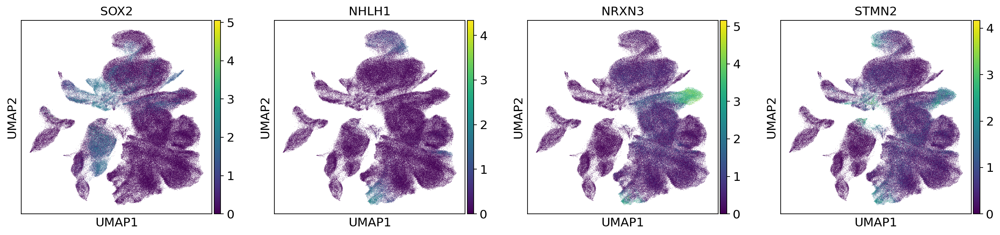

In [ ]:
sc.pl.umap(adata_subset, color = ['SOX2', 'NHLH1', 'NRXN3', 'STMN2'])

In [ ]:
adata_eze = adata_subset[adata_subset.obs["Dataset"] == "Eze"]
adata_trevi = adata_subset[adata_subset.obs["Dataset"] == "Trevino"]
adata_braun = adata_subset[adata_subset.obs["Dataset"] == "Braun"]
adata_cameron = adata_subset[adata_subset.obs["Dataset"] == "Cameron"]

In [ ]:
np.max(adata_eze[:,"ESR2"].layers["counts"])

2.0

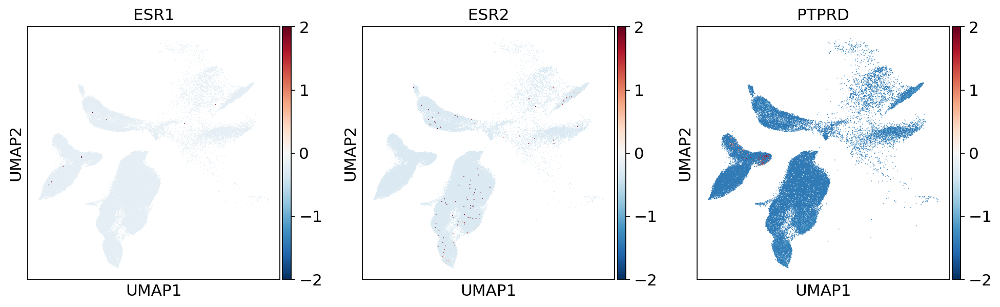

In [ ]:
sc.pl.umap(adata_eze, color = marker_genes, cmap='RdBu_r', layer = "scaled", vmin = -2, vmax = 2, 
          legend_loc='on data', legend_fontsize=5)

In [ ]:
np.max(adata_trevi[:,"ESR2"].layers["counts"])

3.0

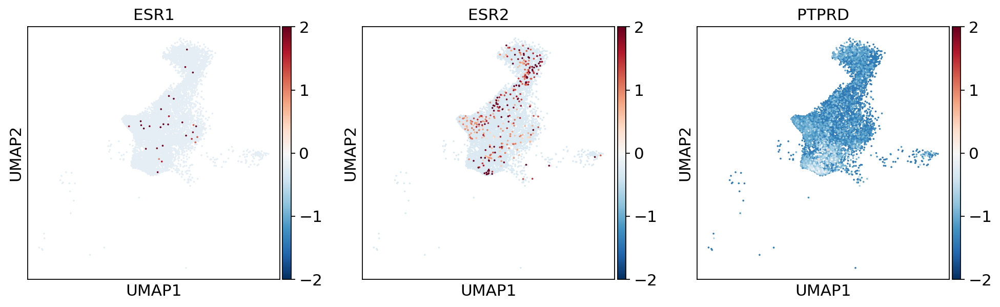

In [ ]:
sc.pl.umap(adata_trevi, color = marker_genes, cmap='RdBu_r', layer = "scaled", vmin = -2, vmax = 2, 
          legend_loc='on data', legend_fontsize=5)

In [ ]:
np.max(adata_braun[:,"ESR2"].layers["counts"])

56.0

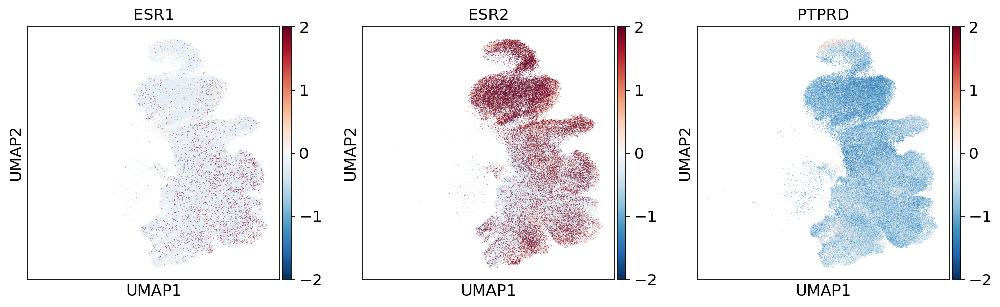

In [ ]:
sc.pl.umap(adata_braun, color = marker_genes, cmap='RdBu_r', layer = "scaled", vmin = -2, vmax = 2, 
          legend_loc='on data', legend_fontsize=5)

In [ ]:
np.max(adata_cameron[:,"ESR2"].layers["counts"])

11.0

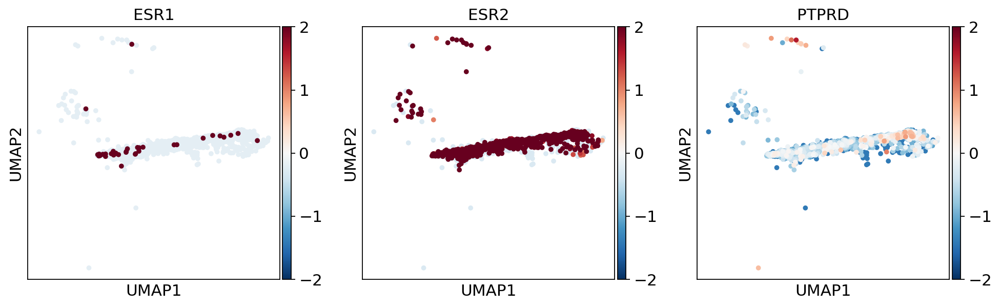

In [ ]:
sc.pl.umap(adata_cameron, color = marker_genes, cmap='RdBu_r', layer = "scaled", vmin = -2, vmax = 2, 
          legend_loc='on data', legend_fontsize=5)

In [ ]:
def split_umap(adata, split_by, ncol=2, nrow=None, **kwargs):
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(5*ncol, 4*nrow))
    axs = axs.flatten()
    for i, cat in enumerate(categories):
        ax = axs[i]
        sc.pl.umap(adata[adata.obs[split_by] == cat], ax=ax, show=False, title=cat, **kwargs)
    plt.tight_layout()

In [68]:
adata_subset2 = adata_subset[adata_subset.obs['Dataset'].isin(['Braun', 'Trevino', 'Cameron', 'Eze'])]

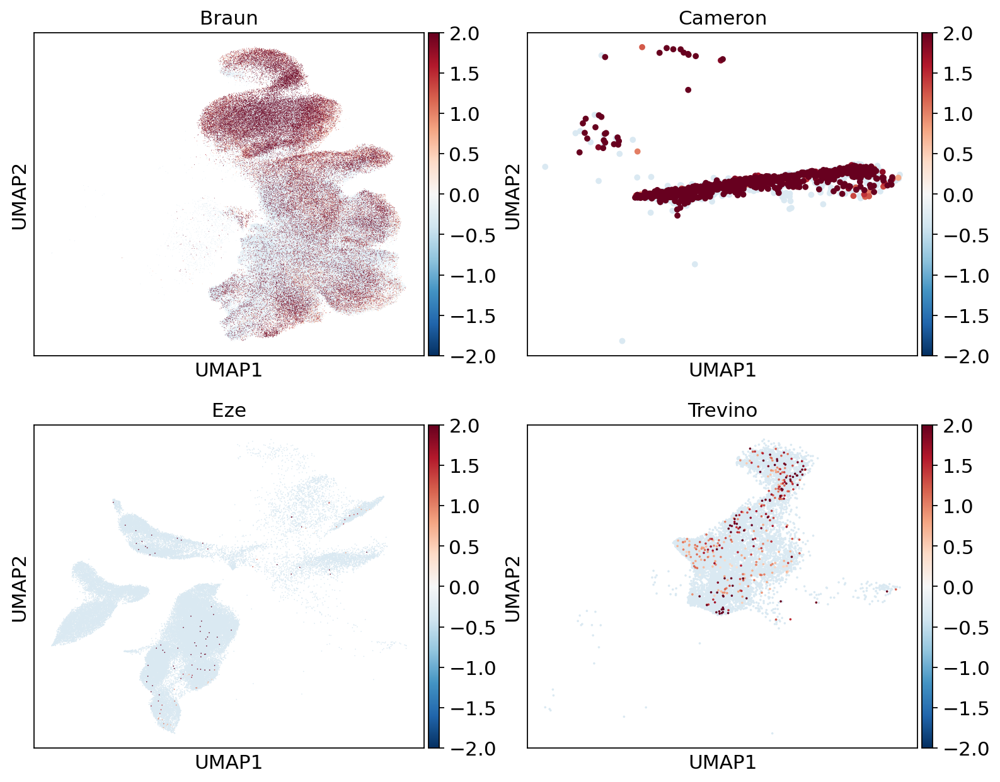

In [70]:
split_umap(adata_subset2, color = 'ESR2', split_by='Dataset', cmap='RdBu_r', layer = "scaled", vmin = -2, vmax = 2, 
          legend_loc='on data', legend_fontsize=5)